<a href="https://colab.research.google.com/github/Cloud2602/Risk-Estimation-from-Multi-Sensor-Motion-Data/blob/main/Risk_estimation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Risk Estimation from Multi Sensor Motion Data

### Download Dataset

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# For v1.0 version of mini dataset
!wget https://man-truckscenes.s3.eu-central-1.amazonaws.com/release/mini/man-truckscenes_metadata_v1.0-mini.zip
!wget https://man-truckscenes.s3.eu-central-1.amazonaws.com/release/mini/man-truckscenes_sensordata_v1.0-mini.zip
!unzip "man-truckscenes_*.zip"

Streaming output truncated to the last 5000 lines.
  inflating: man-truckscenes/sweeps/RADAR_RIGHT_FRONT/RADAR_RIGHT_FRONT_1706716774953983.pcd  
  inflating: man-truckscenes/sweeps/RADAR_RIGHT_FRONT/RADAR_RIGHT_FRONT_1706716775005589.pcd  
  inflating: man-truckscenes/sweeps/RADAR_RIGHT_FRONT/RADAR_RIGHT_FRONT_1706716775052244.pcd  
  inflating: man-truckscenes/sweeps/RADAR_RIGHT_FRONT/RADAR_RIGHT_FRONT_1706716775103591.pcd  
  inflating: man-truckscenes/sweeps/RADAR_RIGHT_FRONT/RADAR_RIGHT_FRONT_1706716775154645.pcd  
  inflating: man-truckscenes/sweeps/RADAR_RIGHT_FRONT/RADAR_RIGHT_FRONT_1706716775202114.pcd  
  inflating: man-truckscenes/sweeps/RADAR_RIGHT_FRONT/RADAR_RIGHT_FRONT_1706716775253343.pcd  
  inflating: man-truckscenes/sweeps/RADAR_RIGHT_FRONT/RADAR_RIGHT_FRONT_1706716775351876.pcd  
  inflating: man-truckscenes/sweeps/RADAR_RIGHT_FRONT/RADAR_RIGHT_FRONT_1706716775403897.pcd  
  inflating: man-truckscenes/sweeps/RADAR_RIGHT_FRONT/RADAR_RIGHT_FRONT_1706716775455406.pcd  

In [2]:
%%bash
mkdir -p /content/data
cd "/content/drive/MyDrive"
unzip -o "man-truckscenes_*.zip" -d "/content"

Archive:  man-truckscenes_sensordata_v1.0-mini.zip
   creating: /content/man-truckscenes/
   creating: /content/man-truckscenes/samples/
   creating: /content/man-truckscenes/samples/CAMERA_LEFT_BACK/
  inflating: /content/man-truckscenes/samples/CAMERA_LEFT_BACK/CAMERA_LEFT_BACK_1695473372666841.jpg  
  inflating: /content/man-truckscenes/samples/CAMERA_LEFT_BACK/CAMERA_LEFT_BACK_1695473373166828.jpg  
  inflating: /content/man-truckscenes/samples/CAMERA_LEFT_BACK/CAMERA_LEFT_BACK_1695473373666803.jpg  
  inflating: /content/man-truckscenes/samples/CAMERA_LEFT_BACK/CAMERA_LEFT_BACK_1695473374166792.jpg  
  inflating: /content/man-truckscenes/samples/CAMERA_LEFT_BACK/CAMERA_LEFT_BACK_1695473374667278.jpg  
  inflating: /content/man-truckscenes/samples/CAMERA_LEFT_BACK/CAMERA_LEFT_BACK_1695473375166805.jpg  
  inflating: /content/man-truckscenes/samples/CAMERA_LEFT_BACK/CAMERA_LEFT_BACK_1695473375666769.jpg  
  inflating: /content/man-truckscenes/samples/CAMERA_LEFT_BACK/CAMERA_LEFT_BAC


2 archives were successfully processed.


Open github repository

In [ ]:
!git clone https://github.com/Cloud2602/Risk-Estimation-from-Multi-Sensor-Motion-Data.git

Cloning into 'Risk-Estimation-from-Multi-Sensor-Motion-Data'...
remote: Enumerating objects: 12, done.
remote: Counting objects: 100% (12/12), done.
remote: Compressing objects: 100% (10/10), done.
Receiving objects: 100% (12/12), done.
Resolving deltas: 100% (2/2), done.
remote: Total 12 (delta 2), reused 0 (delta 0), pack-reused 0 (from 0)


## Initialization

In [3]:
!pip install truckscenes-devkit[all]

  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 447.7/447.7 MB 2.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 71.0/71.0 kB 7.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.9/7.9 MB 123.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 101.7/101.7 kB 10.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 139.8/139.8 kB 13.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 228.0/228.0 kB 20.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.3/12.3 MB 126.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 69.1/69.1 kB 6.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 386.9/386.9 kB 34.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 133.5/133.5 kB 13.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 59.7/59.7 kB 5.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 75.2 MB/s eta 0:00:00
   ━━

In [4]:
%matplotlib inline
from truckscenes import TruckScenes

trucksc = TruckScenes('v1.0-mini', 'man-truckscenes', True)

Loading truckscenes tables for version v1.0-mini...
11 attribute,
18 calibrated_sensor,
27 category,
20090 ego_motion_cabin,
20089 ego_motion_chassis,
20116 ego_pose,
1094 instance,
400 sample,
25750 sample_annotation,
43556 sample_data,
10 scene,
18 sensor,
4 visibility,
Done loading in 1.197 seconds.
Reverse indexing ...
Done reverse indexing in 0.3 seconds.


BEV

In [ ]:
!mkdir /content/man-truckscenes/samples/BEV


In [6]:
import json

file_path = "/content/man-truckscenes/v1.0-mini/sample_data.json"

try:
    with open(file_path, 'r') as f:
        data = json.load(f)
    print("✅ JSON caricato correttamente.")
except json.JSONDecodeError as e:
    print("❌ Errore nel parsing del file JSON:")
    print(f"  Messaggio: {e.msg}")
    print(f"  Riga: {e.lineno}, Colonna: {e.colno}")
    print(f"  Posizione: {e.pos}")

    # Stampa la riga problematica
    with open(file_path, 'r') as f:
        lines = f.readlines()
        if e.lineno <= len(lines):
            print("\n🔍 Riga con l'errore:")
            print(lines[e.lineno - 1].rstrip())
        else:
            print("⚠️ Impossibile accedere alla riga dell'errore: fuori intervallo.")
except FileNotFoundError:
    print("❌ File non trovato.")
except Exception as e:
    print(f"❌ Altro errore: {e}")


✅ JSON caricato correttamente.


LIDAR_LEFT: 80729 punti
LIDAR_RIGHT: 81221 punti
LIDAR_TOP_FRONT: 17458 punti
LIDAR_TOP_LEFT: 23344 punti
LIDAR_TOP_RIGHT: 22034 punti
LIDAR_REAR: 17262 punti
Totale punti uniti nel frame 0: 242048


<ipython-input-7-1be36ac0cd04>:35: RuntimeWarning: invalid value encountered in divide
  intensities_scaled = ((intensities - np.min(intensities)) /
<ipython-input-7-1be36ac0cd04>:36: RuntimeWarning: invalid value encountered in cast
  np.ptp(intensities) * 255).astype(np.uint8)
<ipython-input-7-1be36ac0cd04>:46: RuntimeWarning: overflow encountered in scalar add
  R[xi, yi] += 1


AttributeError: 'NoneType' object has no attribute 'savefig'

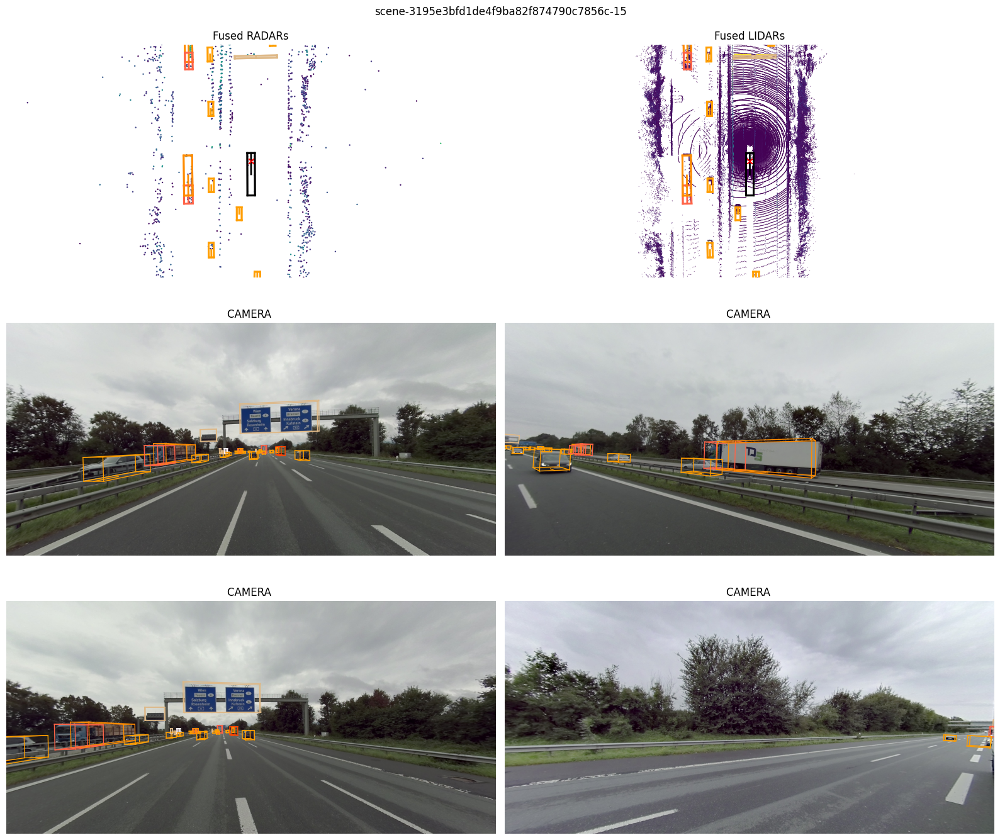

In [7]:
from scipy.spatial.transform import Rotation as R
import numpy as np
import json
import open3d as o3d
import glob
import os
import cv2
from PIL import Image
from matplotlib import pyplot as plt
from truckscenes import TruckScenes  # Assicurati di aver installato il devkit

def bev_rgb_enhanced(points, intensities=None,
                     res=0.1,
                     side_range=(-25, 25), fwd_range=(0, 50),
                     height_range=(-2, 2), ground_threshold=-1.5):

    x, y, z = points[:, 0], points[:, 1], points[:, 2]
    if intensities is None:
        intensities = np.ones_like(x)

    mask = (
        (x > fwd_range[0]) & (x < fwd_range[1]) &
        (y > side_range[0]) & (y < side_range[1]) &
        (z > ground_threshold)
    )
    x, y, z, intensities = x[mask], y[mask], z[mask], intensities[mask]

    x_img = ((x - fwd_range[0]) / res).astype(np.int32)
    y_img = ((y - side_range[0]) / res).astype(np.int32)
    H = int((fwd_range[1] - fwd_range[0]) / res)
    W = int((side_range[1] - side_range[0]) / res)

    z_scaled = ((np.clip(z, *height_range) - height_range[0]) /
                (height_range[1] - height_range[0]) * 255).astype(np.uint8)
    intensities_scaled = ((intensities - np.min(intensities)) /
                          np.ptp(intensities) * 255).astype(np.uint8)

    R = np.zeros((H, W), dtype=np.uint8)
    G = np.zeros((H, W), dtype=np.uint8)
    B = np.zeros((H, W), dtype=np.uint8)
    count = np.zeros((H, W), dtype=np.uint16)

    for xi, yi, zi, ii in zip(x_img, y_img, z_scaled, intensities_scaled):
        G[xi, yi] = max(G[xi, yi], zi)
        B[xi, yi] = max(B[xi, yi], ii)
        R[xi, yi] += 1
        count[xi, yi] += 1

    R = np.clip((R / R.max()) * 255, 0, 255).astype(np.uint8)

    R_eq = cv2.equalizeHist(R)
    G_eq = cv2.equalizeHist(G)
    B_eq = cv2.equalizeHist(B)

    bev = np.stack([R_eq, G_eq, B_eq], axis=-1)
    bev = np.array(Image.fromarray(bev).resize((512, 512)))

    return bev


def build_transformation_matrix(rotation_quat, translation):
    r = R.from_quat([rotation_quat[1], rotation_quat[2], rotation_quat[3], rotation_quat[0]])
    rot_matrix = r.as_matrix()
    trans_matrix = np.eye(4)
    trans_matrix[:3, :3] = rot_matrix
    trans_matrix[:3, 3] = translation
    return trans_matrix

def transform_pointcloud(points, transform):
    points_h = np.hstack((points, np.ones((points.shape[0], 1))))
    transformed = (transform @ points_h.T).T
    return transformed[:, :3]

# === Inizializzazione dataset ===
sensor_map = {
    "1c4f2bbb64f847a193c748c1c14f0574": "LIDAR_LEFT",
    "fe19aa64da874708a8cd417103e7cdc7": "LIDAR_RIGHT",
    "3f53edcde9e44caaba5e689726c7aab7": "LIDAR_TOP_FRONT",
    "9ecd75e3eaf643d5b1d5a6cefba7f1f3": "LIDAR_TOP_LEFT",
    "fcddf720b15b4bc3b59eef0bdf3e0f94": "LIDAR_TOP_RIGHT",
    "40dad62928a4498699eebf9aa7f4be98": "LIDAR_REAR",
}

with open("man-truckscenes/v1.0-mini/calibrated_sensor.json", "r") as f:
    calibration_data = json.load(f)

sensor_transforms = {}
for entry in calibration_data:
    token = entry["sensor_token"]
    if token in sensor_map:
        T = build_transformation_matrix(entry["rotation"], entry["translation"])
        sensor_transforms[sensor_map[token]] = T

# === Carica devkit e sample_data.json ===
with open("man-truckscenes/v1.0-mini/sample_data.json") as f:
    sample_data = json.load(f)

# === File LiDAR ===
base_dir = "/content/man-truckscenes/samples"
sensor_dirs = list(sensor_transforms.keys())

sensor_files = {}
for sensor in sensor_dirs:
    files = sorted(glob.glob(os.path.join(base_dir, sensor, "*.pcd")))
    sensor_files[sensor] = files

num_frames = min(len(files) for files in sensor_files.values())

# === Ciclo principale ===
for i in range(num_frames):
    all_points = []

    for sensor in sensor_dirs:
        file_path = sensor_files[sensor][i]
        pcd = o3d.io.read_point_cloud(file_path)
        points = np.asarray(pcd.points)
        T = sensor_transforms[sensor]
        points_transformed = transform_pointcloud(points, T)
        all_points.append(points_transformed)
        print(f"{sensor}: {points_transformed.shape[0]} punti")

    merged_points = np.vstack(all_points)
    print(f"Totale punti uniti nel frame {i}: {merged_points.shape[0]}")

    # === 1. Salva immagine BEV personalizzata ===
    bev_image = bev_rgb_enhanced(merged_points)
    Image.fromarray(bev_image).save(f"/content/bev_frame_{i:05d}.png")

    # === 2. Trova sample_token usando LIDAR_LEFT ===
    reference_filename = os.path.basename(sensor_files["LIDAR_TOP_FRONT"][i])
    sample_token = None
    for entry in sample_data:
        if reference_filename in entry["filename"]:
            sample_token = entry["sample_token"]
            break

    # === 3. Render devkit image con bounding box ===
    if sample_token:
        fig = trucksc.render_sample(sample_token)
        fig.savefig(f"/content/render_sample_{i:05d}.png")
        plt.close(fig)


In [11]:
# Mostra i primi 5 sample_token validi
valid_samples = trucksc.sample
for i in range(5):
    print(f"[{i}] sample_token:", valid_samples[i]['token'])


[0] sample_token: 32d2bcf46e734dffb14fe2e0a823d059
[1] sample_token: deb7b3f332f042d49e7636d6e4959354
[2] sample_token: a574551be31547e4b7c78ff87c75abb3
[3] sample_token: 1393759bf6ff4f8e88deff0da0dc2aca
[4] sample_token: 368662645c194921b716c026347db664


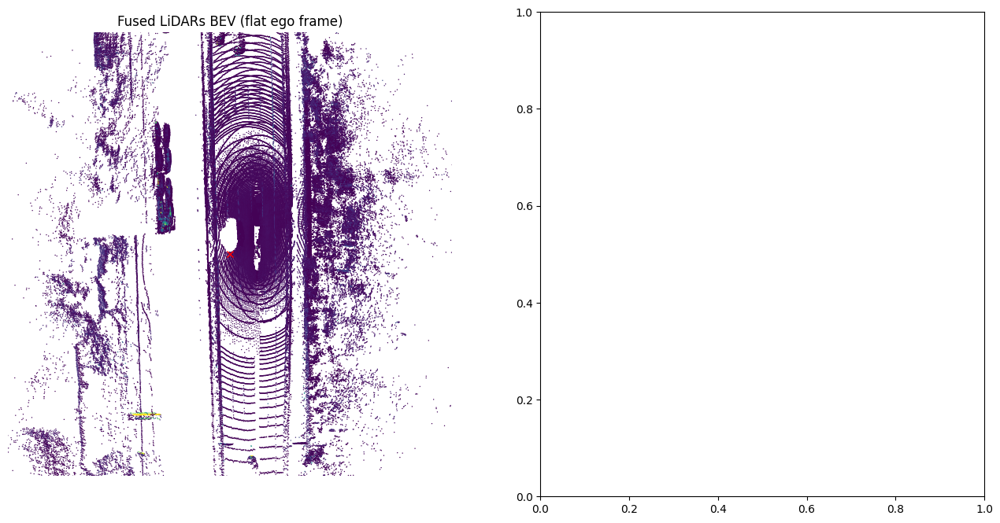

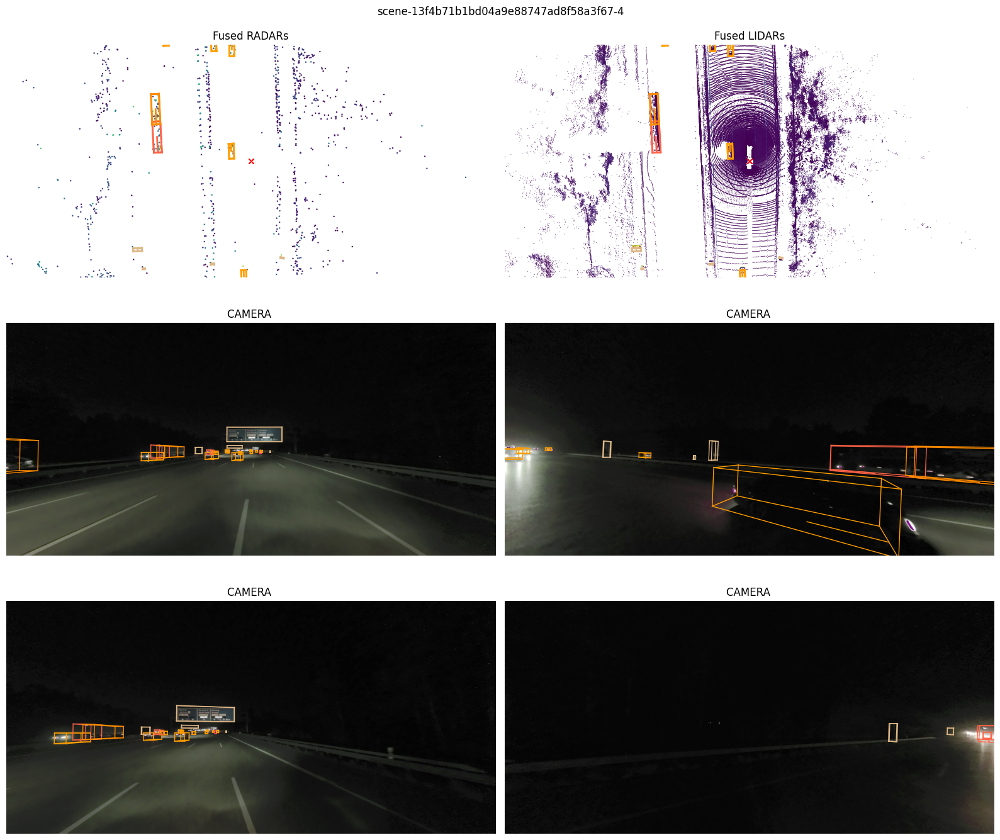

In [25]:
import matplotlib.pyplot as plt
from matplotlib.cm import ScalarMappable
from matplotlib.colors import Normalize
from pyquaternion import Quaternion
import numpy as np

from __future__ import annotations

import copy
import os.path as osp
import warnings

from abc import ABC, abstractmethod
from functools import reduce
from importlib import import_module
from typing import Tuple, List, Dict

import numpy as np
import pypcd4

from pyquaternion import Quaternion

from truckscenes.utils.geometry_utils import transform_matrix


class PointCloud(ABC):
    """
    Abstract class for manipulating and viewing point clouds.
    Every point cloud (lidar and radar) consists of points where:
    - Dimensions 0, 1, 2 represent x, y, z coordinates.
        These are modified when the point cloud is rotated or translated.
    - All other dimensions are optional. Hence these have to be manually modified
        if the reference frame changes.
    """

    def __init__(self, points: np.ndarray, timestamps: np.ndarray = None):
        """
        Initialize a point cloud and check it has the correct dimensions.
        :param points: <np.float: d, n>. d-dimensional input point cloud matrix.
        """
        assert points.shape[0] == self.nbr_dims(), \
            'Error: Pointcloud points must have format: %d x n' % self.nbr_dims()
        self.points = points
        self.timestamps = timestamps

    @staticmethod
    @abstractmethod
    def nbr_dims() -> int:
        """
        Returns the number of dimensions.
        :return: Number of dimensions.
        """
        pass

    @classmethod
    @abstractmethod
    def from_file(cls, file_name: str) -> PointCloud:
        """
        Loads point cloud from disk.
        :param file_name: Path of the pointcloud file on disk.
        :return: PointCloud instance.
        """
        pass

    @classmethod
    def from_file_multisweep(cls,
                             trucksc,
                             sample_rec: Dict,
                             chan: str,
                             ref_chan: str,
                             nsweeps: int = 5,
                             min_distance: float = 1.0) -> Tuple[PointCloud, np.ndarray]:
        """
        Return a point cloud that aggregates multiple sweeps.
        As every sweep is in a different coordinate frame, we need to map the coordinates
        to a single reference frame.
        As every sweep has a different timestamp, we need to account for that in
        the transformations and timestamps.

        Arguments:
            trucksc: A TruckScenes instance.
            sample_rec: The current sample.
            chan: The lidar/radar channel from which we track back n sweeps to aggregate
                the point cloud.
            ref_chan: The reference channel of the current sample_rec that the
                point clouds are mapped to.
            nsweeps: Number of sweeps to aggregated.
            min_distance: Distance below which points are discarded.

        Returns:
            all_pc: The aggregated point cloud.
            all_times: The aggregated timestamps.
        """
        # Init.
        points = np.zeros((cls.nbr_dims(), 0), dtype=np.float64)
        timestamps = np.zeros((1, 0), dtype=np.uint64)
        all_pc = cls(points, timestamps)
        all_times = np.zeros((1, 0))

        # Get reference pose and timestamp.
        ref_sd_token = sample_rec['data'][ref_chan]
        ref_sd_rec = trucksc.get('sample_data', ref_sd_token)
        ref_pose_rec = trucksc.get('ego_pose', ref_sd_rec['ego_pose_token'])
        ref_cs_rec = trucksc.get('calibrated_sensor', ref_sd_rec['calibrated_sensor_token'])
        ref_time = 1e-6 * ref_sd_rec['timestamp']

        # Homogeneous transform from ego car frame to reference frame.
        ref_from_car = transform_matrix(ref_cs_rec['translation'],
                                        Quaternion(ref_cs_rec['rotation']),
                                        inverse=True)

        # Homogeneous transformation matrix from global to _current_ ego car frame.
        car_from_global = transform_matrix(ref_pose_rec['translation'],
                                           Quaternion(ref_pose_rec['rotation']),
                                           inverse=True)

        # Aggregate current and previous sweeps.
        sample_data_token = sample_rec['data'][chan]
        current_sd_rec = trucksc.get('sample_data', sample_data_token)

        for _ in range(nsweeps):
            # Load up the pointcloud and remove points close to the sensor.
            current_pc = cls.from_file(osp.join(trucksc.dataroot, current_sd_rec['filename']))
            current_pc.remove_close(min_distance)

            # Get past pose.
            current_pose_rec = trucksc.get('ego_pose', current_sd_rec['ego_pose_token'])
            global_from_car = transform_matrix(current_pose_rec['translation'],
                                               Quaternion(current_pose_rec['rotation']),
                                               inverse=False)

            # Homogeneous transformation matrix from sensor coordinate frame to ego car frame.
            current_cs_rec = trucksc.get('calibrated_sensor',
                                         current_sd_rec['calibrated_sensor_token'])
            car_from_current = transform_matrix(current_cs_rec['translation'],
                                                Quaternion(current_cs_rec['rotation']),
                                                inverse=False)

            # Fuse four transformation matrices into one and perform transform.
            trans_matrix = reduce(np.dot, [ref_from_car, car_from_global,
                                           global_from_car, car_from_current])
            current_pc.transform(trans_matrix)

            # Add time vector which can be used as a temporal feature.
            if current_pc.timestamps is not None:
                # Per point difference
                time_lag = ref_time - 1e-6 * current_pc.timestamps
            else:
                # Difference to sample data
                time_lag = ref_time - 1e-6 * current_sd_rec['timestamp']
                time_lag = time_lag * np.ones((1, current_pc.nbr_points()))
            all_times = np.hstack((all_times, time_lag))

            # Merge with key pc.
            all_pc.points = np.hstack((all_pc.points, current_pc.points))
            if current_pc.timestamps is not None:
                all_pc.timestamps = np.hstack((all_pc.timestamps, current_pc.timestamps))

            # Abort if there are no previous sweeps.
            if current_sd_rec['prev'] == '':
                break
            else:
                current_sd_rec = trucksc.get('sample_data', current_sd_rec['prev'])

        return all_pc, all_times

    def nbr_points(self) -> int:
        """
        Returns the number of points.
        :return: Number of points.
        """
        return self.points.shape[1]

    def subsample(self, ratio: float) -> None:
        """
        Sub-samples the pointcloud.
        :param ratio: Fraction to keep.
        """
        selected_ind = np.random.choice(np.arange(0, self.nbr_points()),
                                        size=int(self.nbr_points() * ratio))
        self.points = self.points[:, selected_ind]

    def remove_close(self, radius: float) -> None:
        """
        Removes point too close within a certain radius from origin.
        :param radius: Radius below which points are removed.
        """

        x_filt = np.abs(self.points[0, :]) < radius
        y_filt = np.abs(self.points[1, :]) < radius
        not_close = np.logical_not(np.logical_and(x_filt, y_filt))
        self.points = self.points[:, not_close]

        if self.timestamps is not None:
            self.timestamps = self.timestamps[:, not_close]

    def translate(self, x: np.ndarray) -> None:
        """
        Applies a translation to the point cloud.
        :param x: <np.float: 3, 1>. Translation in x, y, z.
        """
        for i in range(3):
            self.points[i, :] = self.points[i, :] + x[i]

    def rotate(self, rot_matrix: np.ndarray) -> None:
        """
        Applies a rotation.
        :param rot_matrix: <np.float: 3, 3>. Rotation matrix.
        """
        self.points[:3, :] = np.dot(rot_matrix, self.points[:3, :])

    def transform(self, transf_matrix: np.ndarray) -> None:
        """
        Applies a homogeneous transform.
        :param transf_matrix: <np.float: 4, 4>. Homogenous transformation matrix.
        """
        self.points[:3, :] = transf_matrix.dot(
            np.vstack((self.points[:3, :], np.ones(self.nbr_points())))
        )[:3, :]

    def render_height(self,
                      ax,
                      view: np.ndarray = np.eye(4),
                      x_lim: Tuple[float, float] = (-20, 20),
                      y_lim: Tuple[float, float] = (-20, 20),
                      marker_size: float = 1) -> None:
        """
        Very simple method that applies a transformation and then scatter plots the points
        colored by height (z-value).

        :param ax: Axes on which to render the points.
        :param view: <np.float: n, n>. Defines an arbitrary projection (n <= 4).
        :param x_lim: (min, max). x range for plotting.
        :param y_lim: (min, max). y range for plotting.
        :param marker_size: Marker size.
        """
        # Initialize visualization methods
        try:
            _render_helper = getattr(import_module("truckscenes.utils.visualization_utils"),
                                     "_render_pc_helper")
        except ModuleNotFoundError:
            print('''The visualization dependencies are not installed on your system! '''
                  '''Run 'pip install "truckscenes-devkit[all]"'.''')

        # Render point cloud
        _render_helper(2, ax, view, x_lim, y_lim, marker_size)

    def render_intensity(self,
                         ax,
                         view: np.ndarray = np.eye(4),
                         x_lim: Tuple[float, float] = (-20, 20),
                         y_lim: Tuple[float, float] = (-20, 20),
                         marker_size: float = 1) -> None:
        """
        Very simple method that applies a transformation and then scatter plots the points
        colored by intensity.

        :param ax: Axes on which to render the points.
        :param view: <np.float: n, n>. Defines an arbitrary projection (n <= 4).
        :param x_lim: (min, max).
        :param y_lim: (min, max).
        :param marker_size: Marker size.
        """
        # Initialize visualization methods
        try:
            _render_helper = getattr(import_module("truckscenes.utils.visualization_utils"),
                                     "_render_pc_helper")
        except ModuleNotFoundError:
            warnings.warn('''The visualization dependencies are not installed on your system! '''
                          '''Run 'pip install "truckscenes-devkit[all]"'.''')

        # Render point cloud
        _render_helper(3, ax, view, x_lim, y_lim, marker_size)


class LidarPointCloud(PointCloud):

    @staticmethod
    def nbr_dims() -> int:
        """
        Returns the number of dimensions.
        :return: Number of dimensions.
        """
        return 4

    @classmethod
    def from_file(cls, file_name: str) -> LidarPointCloud:
        """
        Loads LIDAR data from binary numpy format. Data is stored
        as (x, y, z, intensity, ring index).

        :param file_name: Path of the pointcloud file on disk.
        :return: LidarPointCloud instance (x, y, z, intensity).
        """

        assert file_name.endswith('.pcd'), 'Unsupported filetype {}'.format(file_name)

        lidar = pypcd4.PointCloud.from_path(file_name)

        lidar_data = lidar.pc_data
        points = np.array([lidar_data["x"], lidar_data["y"], lidar_data["z"],
                           lidar_data["intensity"]], dtype=np.float64)

        return cls(points, np.atleast_2d(lidar_data["timestamp"]))

def transform_matrix(translation: np.ndarray = np.array([0, 0, 0]),
                     rotation: Quaternion = Quaternion([1, 0, 0, 0]),
                     inverse: bool = False) -> np.ndarray:
    """
    Convert pose to transformation matrix.
    :param translation: <np.float32: 3>. Translation in x, y, z.
    :param rotation: Rotation in quaternions (w ri rj rk).
    :param inverse: Whether to compute inverse transform matrix.
    :return: <np.float32: 4, 4>. Transformation matrix.
    """
    tm = np.eye(4)

    if inverse:
        rot_inv = rotation.rotation_matrix.T
        trans = np.transpose(-np.array(translation))
        tm[:3, :3] = rot_inv
        tm[:3, 3] = rot_inv.dot(trans)
    else:
        tm[:3, :3] = rotation.rotation_matrix
        tm[:3, 3] = np.transpose(np.array(translation))

    return tm

def view_points(points: np.ndarray, view: np.ndarray, normalize: bool) -> np.ndarray:
    """
    This is a helper class that maps 3d points to a 2d plane. It can be used to implement
    both perspective and orthographic projections. It first applies the dot product between
    the points and the view. By convention, the view should be such that the data is projected
    onto the first 2 axis. It then optionally applies a normalization along the third dimension.

    For a perspective projection the view should be a 3x3 camera matrix, and normalize=True
    For an orthographic projection with translation the view is a 3x4 matrix and normalize=False
    For an orthographic projection without translation the view is a 3x3 matrix
    (optionally 3x4 with last columns all zeros) and normalize=False

    :param points: <np.float32: 3, n> Matrix of points, where each point (x, y, z)
        is along each column.
    :param view: <np.float32: n, n>. Defines an arbitrary projection (n <= 4).
        The projection should be such that the corners are projected onto the first 2 axis.
    :param normalize: Whether to normalize the remaining coordinate (along the third axis).
    :return: <np.float32: 3, n>. Mapped point. If normalize=False,
        the third coordinate is the height.
    """
    assert view.shape[0] <= 4
    assert view.shape[1] <= 4
    assert points.shape[0] == 3

    viewpad = np.eye(4)
    viewpad[:view.shape[0], :view.shape[1]] = view

    nbr_points = points.shape[1]

    # Do operation in homogenous coordinates.
    points = np.concatenate((points, np.ones((1, nbr_points))))
    points = np.dot(viewpad, points)
    points = points[:3, :]

    if normalize:
        points = points / points[2:3, :].repeat(3, 0).reshape(3, nbr_points)

    return points


def render_fused_lidar_flat(trucksc, sample_token: str,
                            sensor_channels: List[str] = None,
                            ax=None, cmap='viridis', axes_limit=40):
    """
    Renderizza tutti i LiDAR (fusi) in coordinate FLAT (coerente col devkit).
    """
    if sensor_channels is None:
        sensor_channels = [
            'LIDAR_LEFT', 'LIDAR_RIGHT', 'LIDAR_REAR',
            'LIDAR_TOP_FRONT', 'LIDAR_TOP_LEFT', 'LIDAR_TOP_RIGHT'
        ]

    sample = trucksc.get('sample', sample_token)

    all_points = []
    all_intensities = []

    # Riferimento flat ego vehicle
    ref_sd_token = sample['data']['LIDAR_TOP_FRONT']
    ref_sd = trucksc.get('sample_data', ref_sd_token)
    ref_cs = trucksc.get('calibrated_sensor', ref_sd['calibrated_sensor_token'])
    ref_pose = trucksc.get('ego_pose', ref_sd['ego_pose_token'])

    ref_to_ego = transform_matrix(ref_cs['translation'], Quaternion(ref_cs['rotation']))
    ego_yaw = Quaternion(ref_pose['rotation']).yaw_pitch_roll[0]

    # Ego vehicle → flat ego
    R_flat = Quaternion(axis=[0, 0, 1], angle=ego_yaw).rotation_matrix @ \
             Quaternion(ref_pose['rotation']).inverse.rotation_matrix
    ego_to_flat = np.eye(4)
    ego_to_flat[:3, :3] = R_flat

    # Flat ego → up (z verso alto)
    flat_up = np.eye(4)
    rotation_matrix = (ego_to_flat @ ref_to_ego)[:3, :3]
    rotation_axis = Quaternion(matrix=rotation_matrix)

    flat_up[:3, :3] = Quaternion(axis=rotation_axis.rotate([0, 0, 1]),
                                 angle=np.pi / 2).rotation_matrix

    # Matrice finale
    viewpoint = flat_up @ ego_to_flat @ transform_matrix(ref_cs['translation'],
                                                         Quaternion(ref_cs['rotation']))

    # Per ogni LiDAR
    for channel in sensor_channels:
        sd_token = sample['data'][channel]
        sd = trucksc.get('sample_data', sd_token)
        cs = trucksc.get('calibrated_sensor', sd['calibrated_sensor_token'])
        pose = trucksc.get('ego_pose', sd['ego_pose_token'])

        pc = LidarPointCloud.from_file(os.path.join(trucksc.dataroot, sd['filename']))
        pc.remove_close(1.0)

        # Trasformazioni
        lidar_to_ego = transform_matrix(cs['translation'], Quaternion(cs['rotation']))
        ego_to_global = transform_matrix(pose['translation'], Quaternion(pose['rotation']))
        global_to_ego = transform_matrix(ref_pose['translation'], Quaternion(ref_pose['rotation']), inverse=True)

        full_transform = viewpoint @ global_to_ego @ ego_to_global @ lidar_to_ego
        pc.transform(full_transform)

        all_points.append(pc.points[:3, :])
        all_intensities.append(pc.points[3, :])

    # Merge
    points = np.concatenate(all_points, axis=1)
    intensities = np.concatenate(all_intensities, axis=0)

    # Visualizza
    norm = Normalize(vmin=np.min(intensities), vmax=np.max(intensities), clip=True)
    mapper = ScalarMappable(norm=norm, cmap=plt.get_cmap(cmap))
    colors = mapper.to_rgba(intensities)[..., :3]

    if ax is None:
        _, ax = plt.subplots(1, 1, figsize=(9, 9))

    ax.scatter(points[0, :], points[1, :], marker='o', c=colors, s=1.0, edgecolors='none')
    ax.plot(0, 0, 'x', color='red')
    ax.set_xlim(-axes_limit, axes_limit)
    ax.set_ylim(-axes_limit, axes_limit)
    ax.set_aspect('equal')
    ax.axis('off')
    ax.set_title("Fused LiDARs BEV (flat ego frame)")




token="34d0b00f1801498c803ec07dce543b72"


fig, axes = plt.subplots(1, 2, figsize=(16, 8))

# 1. A sinistra: solo BEV
render_fused_lidar_flat(trucksc, sample_token=token, ax=axes[0])


# 2. A destra: con box del devkit
trucksc.render_sample(token, verbose=False)


